In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('/Users/dodkins/PythonProjects/stocks/options_testing/options_testing')

import os
from datetime import datetime 
import pandas as pd
import opstrat as op

from robinhood import get_options_plays
from yahoo import get_tsla 
from plots import plot_candles, plot_line, plot
from options import get_option_history, weekly_short_calls, LEAPS
from utils import aggregate
from quantconnect import load_tsla_hourly

In [2]:
tsla = load_tsla_hourly()

In [3]:
import plotly.express as px

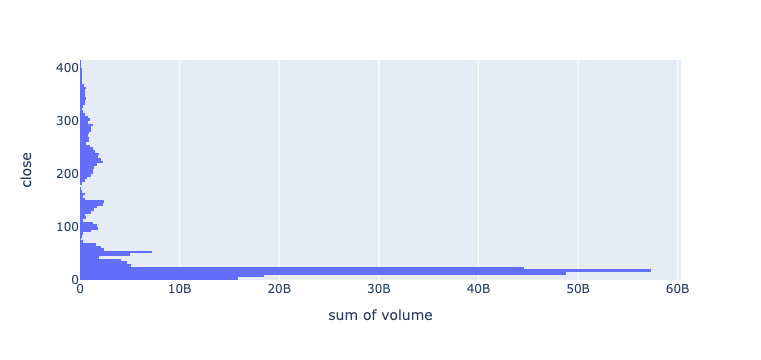

In [4]:
px.histogram(tsla, x='volume', y='close', nbins=150, orientation='h').show()

In [5]:
tsla.iloc[-6000:]

,open,high,low,close,volume
datetime,,,,,
2019-04-16 12:00:00,18.105998,18.166665,18.051332,18.163998,14269651.0
2019-04-16 13:00:00,18.160665,18.246665,18.110665,18.217998,13315246.0
2019-04-16 14:00:00,18.219332,18.315998,18.203332,18.287332,12976426.0
2019-04-16 15:00:00,18.290665,18.333331,18.230665,18.230665,11424346.0
2019-04-16 16:00:00,18.229998,18.256665,18.107998,18.223998,17270027.0
...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0


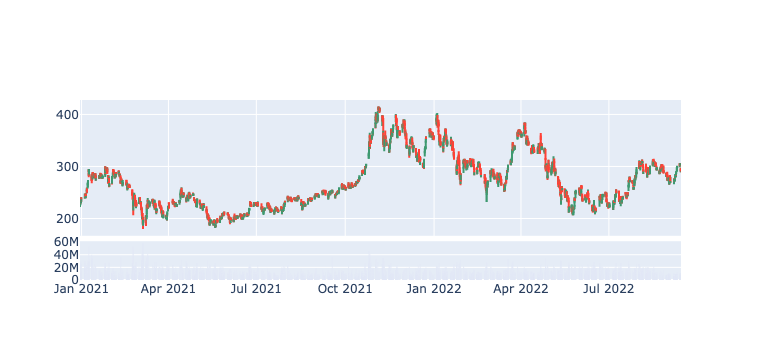

In [6]:
plot(tsla.iloc[-3000:])

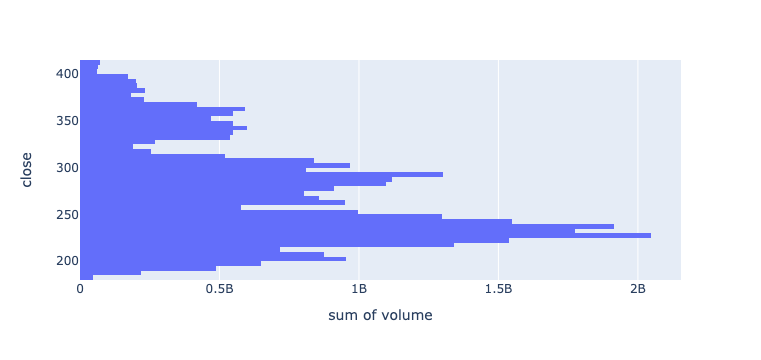

In [7]:
px.histogram(tsla.iloc[-3000:], x='volume', y='close', nbins=100, orientation='h').show()

In [8]:
recent = tsla.iloc[-3000:]

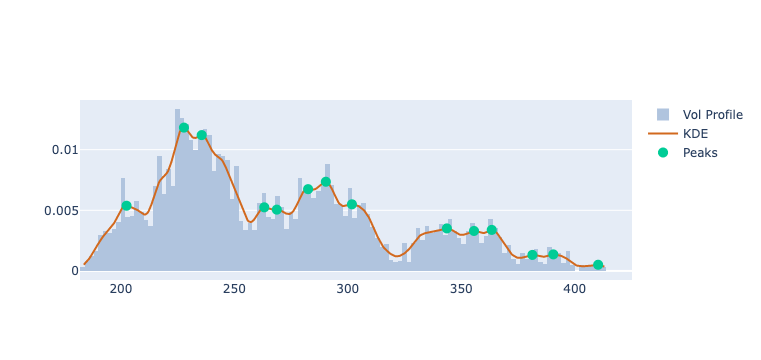

In [9]:
from plots import plot_KDE
from technical_analysis import KDE_profile
kde_p = KDE_profile(recent)
plot_KDE(recent, *kde_p)

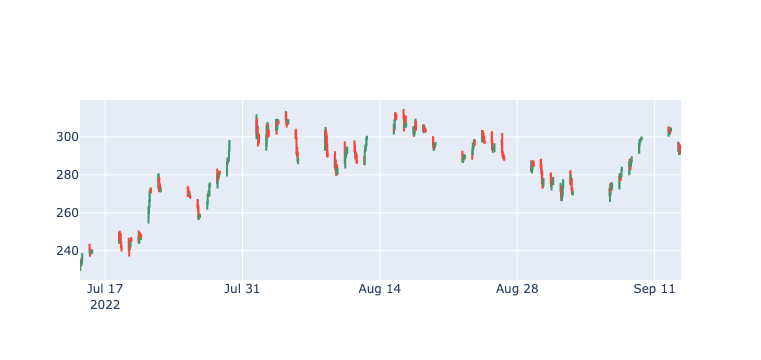

In [10]:
recent = tsla.iloc[-300:]
plot_candles(recent, show_volume=False)

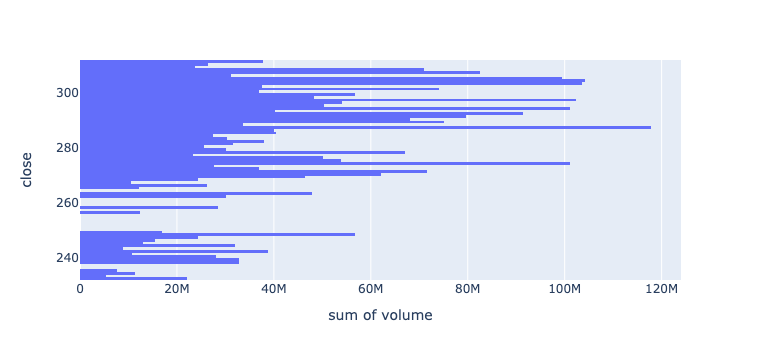

In [11]:
from plots import volume_profile
volume_profile(recent)

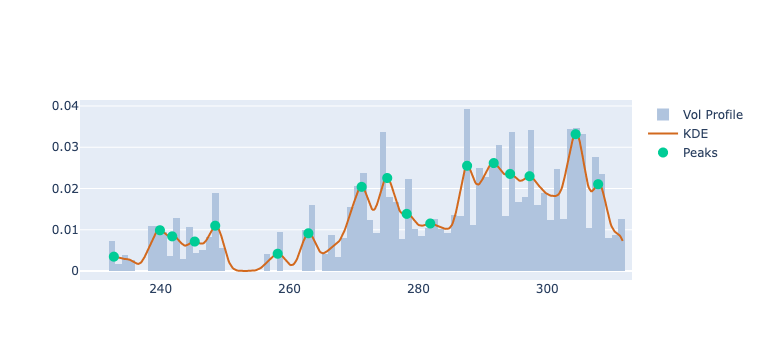

In [12]:
kde_p = KDE_profile(recent)
plot_KDE(recent, *kde_p)

In [14]:
max(kde_p[1])

0.03317140516743251

In [15]:
from technical_analysis import get_poc

In [17]:
from technical_analysis import get_poc
from utils import concat_dfs

In [21]:
r = concat_dfs(recent, get_poc(recent, 30))

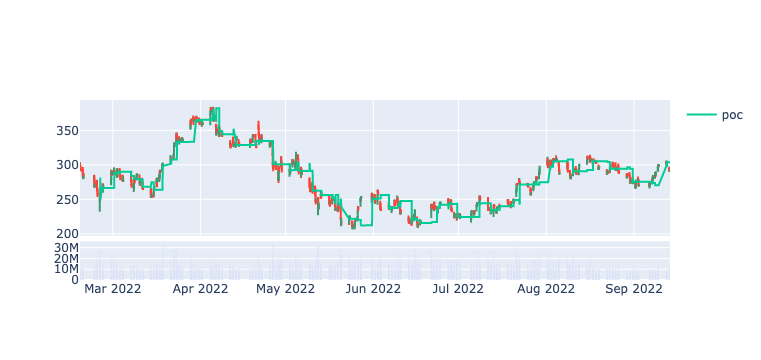

In [22]:
plot_candles(r, lines=['poc'])

In [23]:
r

,open,high,low,close,volume,poc
datetime,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN
...,...,...,...,...,...,...
2022-09-13 12:00:00,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996
2022-09-13 13:00:00,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996
2022-09-13 14:00:00,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575


In [24]:
recent.head()

,open,high,low,close,volume,poc
datetime,,,,,,
2022-02-17 11:00:00,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN
2022-02-17 12:00:00,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN
2022-02-17 13:00:00,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN
2022-02-17 14:00:00,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN
2022-02-17 15:00:00,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN


In [25]:
from options import short_calls_dynamic_POC

In [40]:
s = short_calls_dynamic_POC(recent, percent_offset=5, window=30)

In [41]:
s

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
0,302.459970,303.499970,295.999970,297.603304,10738849.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 11:00:00,7,2022-02-18 16:00:00,1.208333,NaN
1,297.643304,299.736637,295.606637,296.379970,7208845.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 12:00:00,7,2022-02-18 16:00:00,1.166667,NaN
2,296.396637,298.109970,295.499970,295.913304,5848780.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 13:00:00,7,2022-02-18 16:00:00,1.125000,NaN
3,295.956637,296.033304,293.366637,293.736637,6047713.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 14:00:00,7,2022-02-18 16:00:00,1.083333,NaN
4,293.709971,293.946637,291.999971,292.799971,5935990.0,NaN,NaN,NaN,NaN,NaN,2022-02-17 15:00:00,7,2022-02-18 16:00:00,1.041667,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,319.260896,1.202368e-11,5.694503e-17,1.202362e-11,2022-09-13 12:00:00,37,2022-09-13 16:00:00,0.166667,-116.810076
996,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,319.260896,5.694503e-17,3.864653e-20,5.690639e-17,2022-09-13 13:00:00,37,2022-09-13 16:00:00,0.125000,-116.810076
997,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,319.218454,3.975720e-20,3.994785e-24,3.975321e-20,2022-09-13 14:00:00,37,2022-09-13 16:00:00,0.083333,-116.810076
998,294.830000,295.970000,293.000000,294.100000,7136008.0,304.017575,319.218454,3.994785e-24,1.076507e-48,3.994785e-24,2022-09-13 15:00:00,37,2022-09-13 16:00:00,0.041667,-116.810076


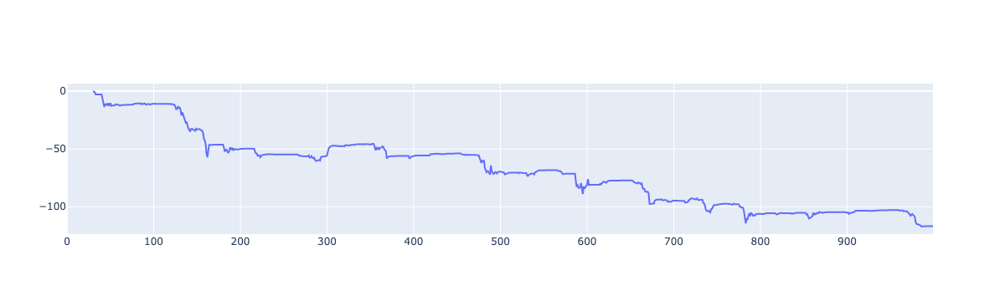

In [29]:
plot_line(s, value='running profit')

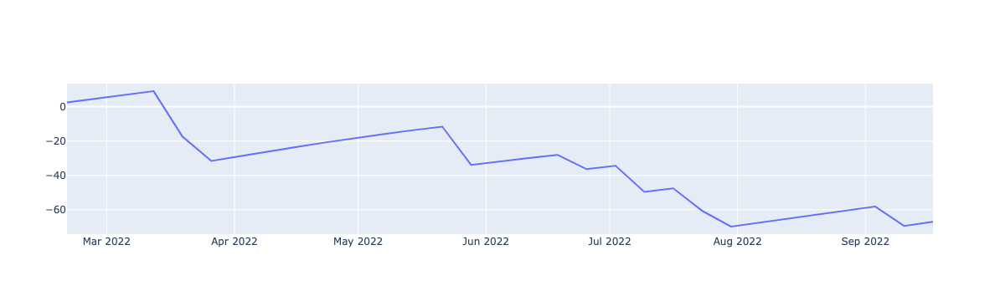

In [30]:
wsc = weekly_short_calls(recent)
plot_line(wsc, value='running profit')

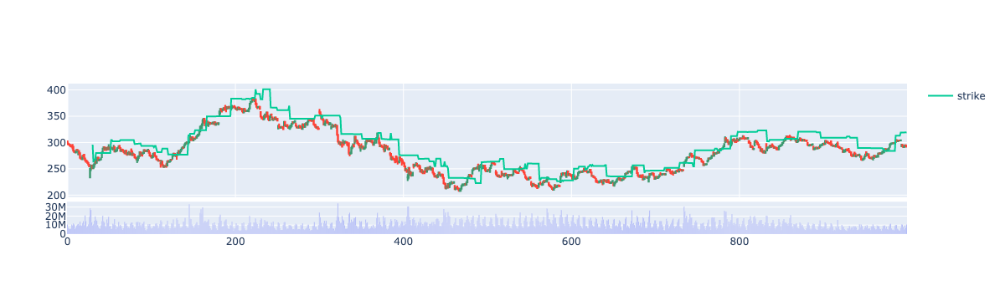

In [31]:
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])

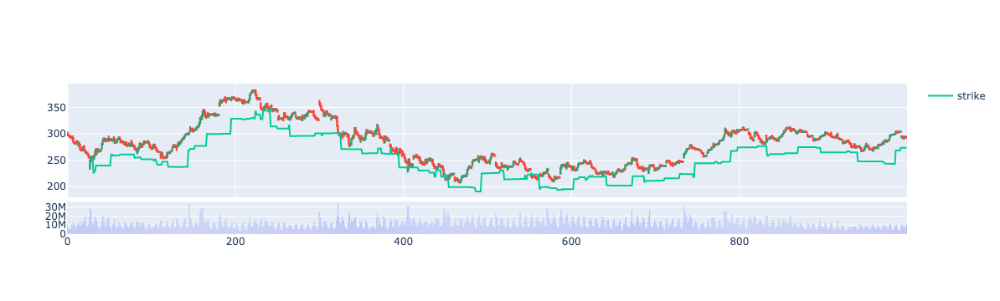

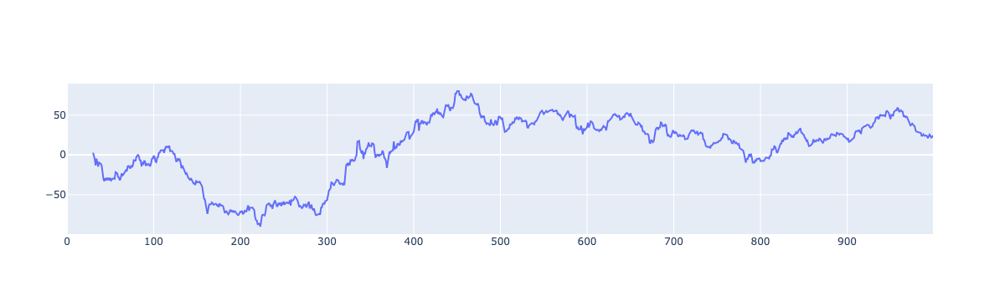

In [32]:
s = short_calls_dynamic_POC(recent, percent_offset=-10, window=30)
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])
plot_line(s, value='running profit')

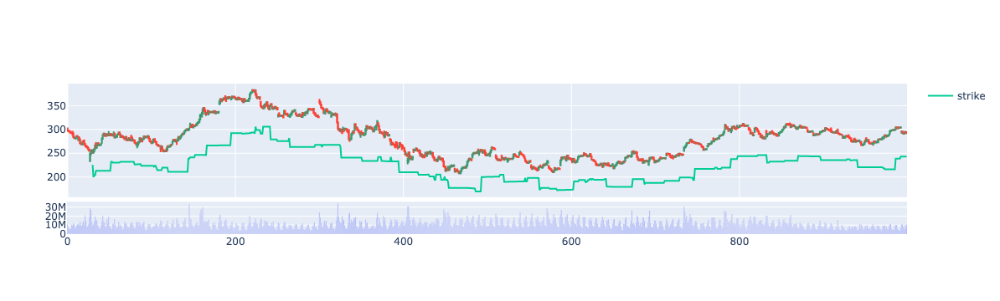

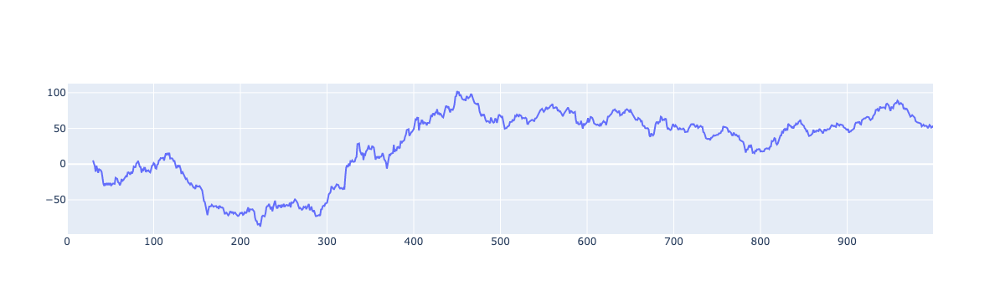

In [33]:
s = short_calls_dynamic_POC(recent, percent_offset=-20, window=30)
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])
plot_line(s, value='running profit')

In [57]:
s.iloc[29:]

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
29,253.083308,257.316641,250.873308,256.263308,13086487.0,NaN,NaN,NaN,NaN,NaN,2022-02-24 12:00:00,8,2022-02-25 16:00:00,1.166667,NaN
30,256.266641,256.949974,250.163308,251.039975,9560209.0,281.792183,281.792183,1.693347e-03,7.804886e-05,1.615298e-03,2022-02-24 13:00:00,8,2022-02-25 16:00:00,1.125000,0.001615
31,250.999975,258.999974,250.166642,255.019974,10906840.0,249.880015,249.880015,3.546397e+00,6.189073e+00,-2.642676e+00,2022-02-24 14:00:00,8,2022-02-25 16:00:00,1.083333,-2.641061
32,255.036641,259.933307,251.799975,258.833307,14775553.0,254.778305,254.778305,3.078736e+00,5.383284e+00,-2.304548e+00,2022-02-24 15:00:00,8,2022-02-25 16:00:00,1.041667,-4.945608
33,258.866641,267.499973,258.363307,266.923307,19498436.0,254.806982,254.806982,5.386902e+00,1.227698e+01,-6.890075e+00,2022-02-24 16:00:00,8,2022-02-25 16:00:00,1.000000,-11.835684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,293.680000,293.990000,290.400000,291.000000,7883773.0,304.057996,304.057996,3.501968e-03,4.166233e-05,3.460305e-03,2022-09-13 12:00:00,37,2022-09-13 16:00:00,0.166667,-126.624157
996,291.000000,293.280000,290.670000,292.300000,5298142.0,304.057996,304.057996,4.166233e-05,1.912525e-05,2.253708e-05,2022-09-13 13:00:00,37,2022-09-13 16:00:00,0.125000,-126.624135
997,292.270000,295.500000,291.780000,294.830000,9703434.0,304.017575,304.017575,1.938772e-05,3.576213e-05,-1.637441e-05,2022-09-13 14:00:00,37,2022-09-13 16:00:00,0.083333,-126.624151
998,294.830000,295.970000,293.000000,294.100000,7136008.0,304.017575,304.017575,3.576213e-05,6.493192e-10,3.576148e-05,2022-09-13 15:00:00,37,2022-09-13 16:00:00,0.041667,-126.624115


In [59]:
s.iloc[29:50].round(2)

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
29,253.08,257.32,250.87,256.26,13086487.0,NaN,NaN,NaN,NaN,NaN,2022-02-24 12:00:00,8,2022-02-25 16:00:00,1.17,NaN
30,256.27,256.95,250.16,251.04,9560209.0,281.792183,281.792183,0.00,0.00,0.00,2022-02-24 13:00:00,8,2022-02-25 16:00:00,1.12,0.00
31,251.00,259.00,250.17,255.02,10906840.0,249.880015,249.880015,3.55,6.19,-2.64,2022-02-24 14:00:00,8,2022-02-25 16:00:00,1.08,-2.64
32,255.04,259.93,251.80,258.83,14775553.0,254.778305,254.778305,3.08,5.38,-2.30,2022-02-24 15:00:00,8,2022-02-25 16:00:00,1.04,-4.95
33,258.87,267.50,258.36,266.92,19498436.0,254.806982,254.806982,5.39,12.28,-6.89,2022-02-24 16:00:00,8,2022-02-25 16:00:00,1.00,-11.84
34,269.89,273.20,260.79,261.45,15978629.0,266.595458,266.595458,3.76,0.13,3.63,2022-02-25 10:00:00,8,2022-02-25 16:00:00,0.25,-8.21
35,261.33,268.41,261.02,266.47,14769004.0,266.582913,266.582913,0.12,1.29,-1.17,2022-02-25 11:00:00,8,2022-02-25 16:00:00,0.21,-9.37
36,266.42,271.60,265.43,271.19,9968734.0,266.55475,266.55475,1.28,4.72,-3.44,2022-02-25 12:00:00,8,2022-02-25 16:00:00,0.17,-12.81
37,271.20,271.61,265.52,266.22,7618126.0,266.516567,266.516567,4.77,0.90,3.87,2022-02-25 13:00:00,8,2022-02-25 16:00:00,0.12,-8.95
38,266.20,268.43,264.85,267.30,6419737.0,266.443828,266.443828,0.93,1.35,-0.42,2022-02-25 14:00:00,8,2022-02-25 16:00:00,0.08,-9.37


In [ ]:
from plots import plot_candles_and_profit

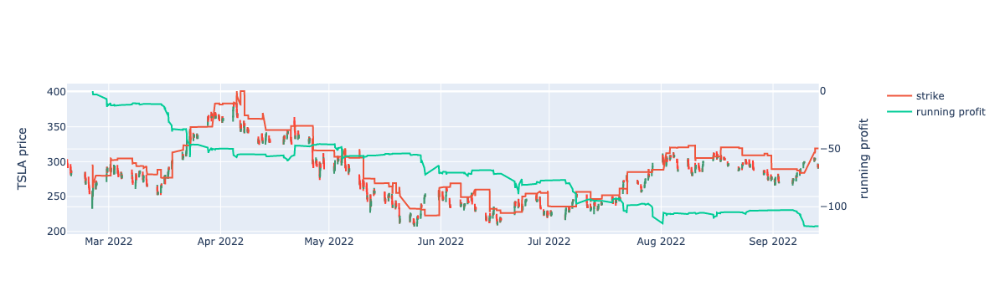

In [51]:
plot_candles_and_profit(s)

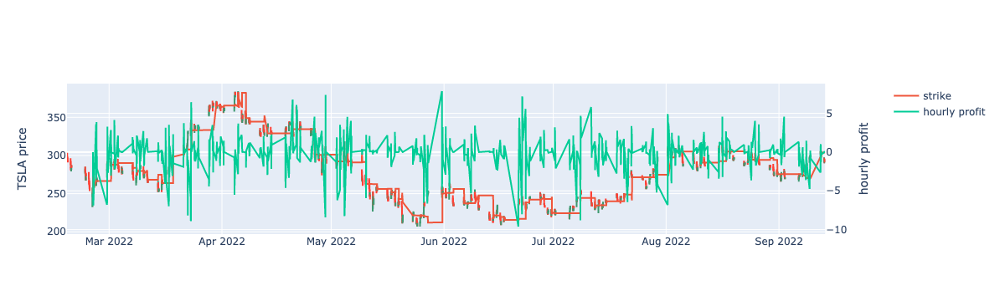

In [60]:
plot_candles_and_profit(s, metric='hourly profit')

In [55]:
wsc

,underlying open,underlying high,underlying low,underlying close,volume,strike,call open,call close,weekly profit,date,running profit
0,302.459970,302.459970,281.229972,285.659971,112299184.0,317.582968,2.392834,0.000000,2.392834,2022-02-19 09:30:00,2.392834
1,277.856639,281.499972,233.463310,269.956640,365703165.0,291.749471,2.198191,0.000000,2.198191,2022-02-26 09:30:00,4.591025
2,271.906639,292.773304,271.906639,279.429972,361427246.0,285.501971,2.151119,0.000000,2.151119,2022-03-05 09:30:00,6.742144
3,285.873305,285.873305,265.209973,265.116640,321703470.0,300.166970,2.261613,0.000000,2.261613,2022-03-12 09:30:00,9.003756
4,260.303307,300.656637,253.783308,301.796636,370315043.0,273.318473,2.059322,28.478164,-26.418842,2022-03-19 09:30:00,-17.415085
5,305.016636,345.269965,304.373303,336.879966,421044307.0,320.267468,2.413060,16.612498,-14.199438,2022-03-26 09:30:00,-31.614524
6,354.999964,368.899963,354.999964,361.529964,315782236.0,372.749963,2.808490,0.000000,2.808490,2022-04-02 09:30:00,-28.806033
7,363.166630,382.403295,342.253299,341.829966,369044633.0,381.324962,2.873099,0.000000,2.873099,2022-04-09 09:30:00,-25.932935
8,326.713301,339.409966,326.713301,328.333301,221665522.0,343.048966,2.584708,0.000000,2.584708,2022-04-16 09:30:00,-23.348227
9,329.729967,358.533297,325.906634,335.016633,320584643.0,346.216465,2.608573,0.000000,2.608573,2022-04-23 09:30:00,-20.739654


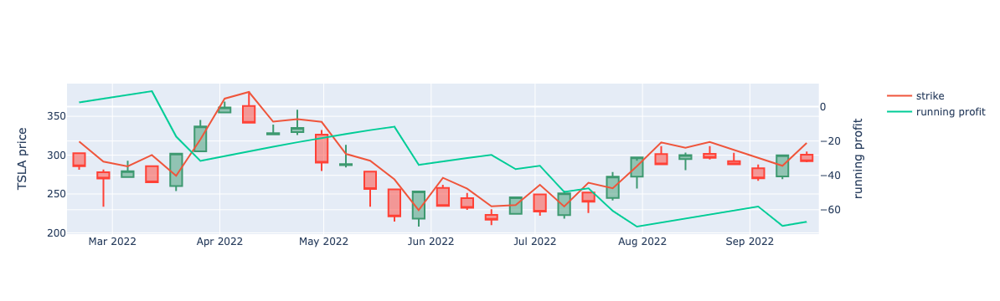

In [53]:
plot_candles_and_profit(wsc)

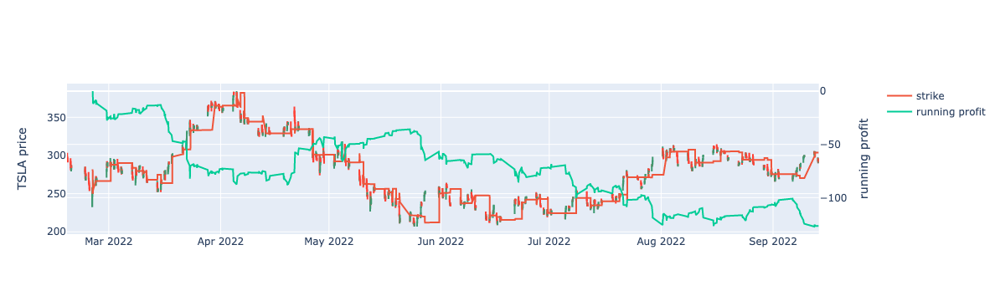

In [52]:
s = short_calls_dynamic_POC(recent, percent_offset=0, window=30)
plot_candles_and_profit(s)

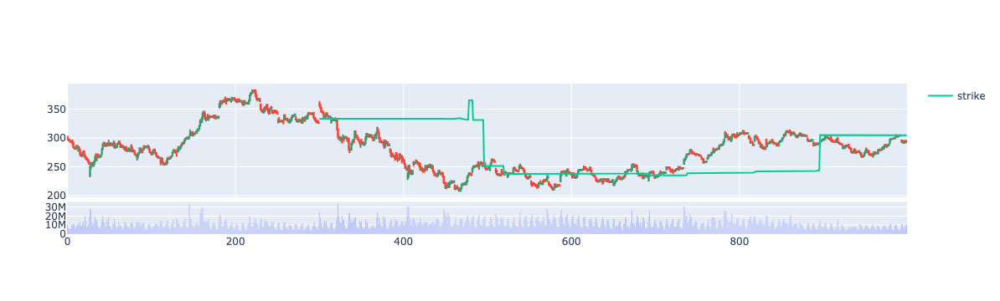

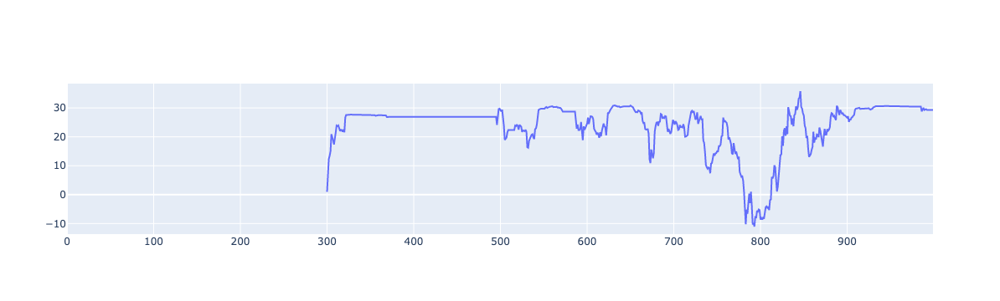

In [271]:
s = short_calls_dynamic_POC(recent, percent_offset=0, window=300)
plot_candles(s, value = ['underlying open', 'underlying high', 'underlying low', 'underlying close'], lines=['strike'])
plot_line(s, value='running profit')

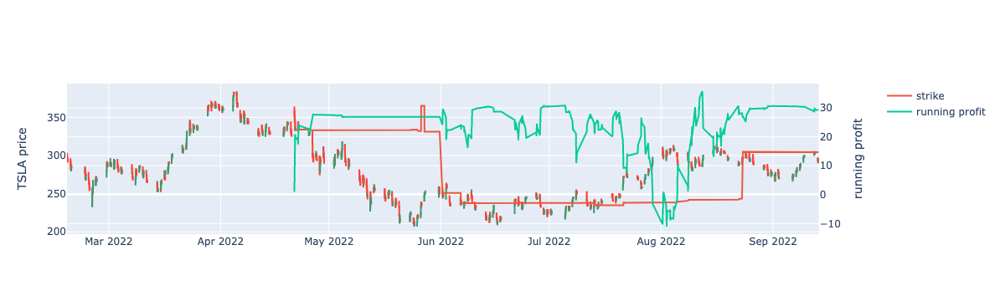

In [61]:
s = short_calls_dynamic_POC(recent, percent_offset=0, window=300)
plot_candles_and_profit(s)

In [63]:
s.iloc[300-1:350].round(2)

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
299,325.94,328.56,325.08,325.73,9930154.0,NaN,NaN,NaN,NaN,NaN,2022-04-20 16:00:00,16,2022-04-22 16:00:00,2.00,NaN
300,358.53,364.07,353.83,357.57,23957396.0,333.014943,333.014943,25.59,24.63,0.96,2022-04-21 10:00:00,16,2022-04-22 16:00:00,1.25,0.96
301,357.52,358.91,350.26,352.26,18625751.0,333.014943,333.014943,24.58,19.41,5.17,2022-04-21 11:00:00,16,2022-04-22 16:00:00,1.21,6.13
302,352.27,352.51,345.36,345.69,12602620.0,333.014943,333.014943,19.42,13.22,6.20,2022-04-21 12:00:00,16,2022-04-22 16:00:00,1.17,12.32
303,345.75,347.44,343.33,344.55,8857858.0,333.014943,333.014943,13.28,12.17,1.11,2022-04-21 13:00:00,16,2022-04-22 16:00:00,1.12,13.43
304,344.55,347.17,342.31,342.72,7482388.0,333.014943,333.014943,12.17,10.55,1.62,2022-04-21 14:00:00,16,2022-04-22 16:00:00,1.08,15.05
305,342.69,342.71,332.67,334.62,12156982.0,333.014943,333.014943,10.53,4.64,5.89,2022-04-21 15:00:00,16,2022-04-22 16:00:00,1.04,20.94
306,334.69,337.67,332.14,336.26,14782597.0,333.280848,333.280848,4.54,5.40,-0.86,2022-04-21 16:00:00,16,2022-04-22 16:00:00,1.00,20.07
307,338.41,340.78,331.35,340.00,11712409.0,333.546754,333.546754,5.31,6.64,-1.32,2022-04-22 10:00:00,16,2022-04-22 16:00:00,0.25,18.75
308,340.04,344.94,335.89,341.57,14888776.0,333.546754,333.546754,6.67,8.08,-1.40,2022-04-22 11:00:00,16,2022-04-22 16:00:00,0.21,17.35


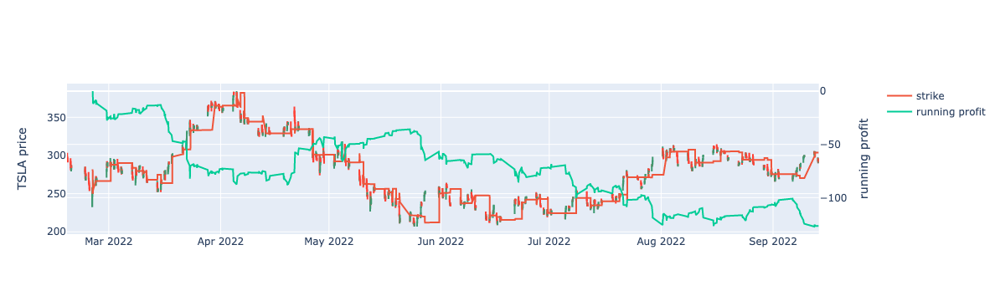

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
299,325.94,328.56,325.08,325.73,9930154.0,334.496306,334.496306,2.04,1.94,0.10,2022-04-20 16:00:00,16,2022-04-22 16:00:00,2.00,-77.32
300,358.53,364.07,353.83,357.57,23957396.0,334.482465,334.482465,24.14,23.18,0.96,2022-04-21 10:00:00,16,2022-04-22 16:00:00,1.25,-76.37
301,357.52,358.91,350.26,352.26,18625751.0,334.474028,334.474028,23.14,18.01,5.13,2022-04-21 11:00:00,16,2022-04-22 16:00:00,1.21,-71.24
302,352.27,352.51,345.36,345.69,12602620.0,334.474028,334.474028,18.02,11.94,6.08,2022-04-21 12:00:00,16,2022-04-22 16:00:00,1.17,-65.16
303,345.75,347.44,343.33,344.55,8857858.0,328.859546,328.859546,17.12,15.95,1.16,2022-04-21 13:00:00,16,2022-04-22 16:00:00,1.12,-64.00
304,344.55,347.17,342.31,342.72,7482388.0,334.474028,334.474028,10.92,9.35,1.56,2022-04-21 14:00:00,16,2022-04-22 16:00:00,1.08,-62.43
305,342.69,342.71,332.67,334.62,12156982.0,334.474028,334.474028,9.34,3.86,5.47,2022-04-21 15:00:00,16,2022-04-22 16:00:00,1.04,-56.96
306,334.69,337.67,332.14,336.26,14782597.0,334.537829,334.537829,3.87,4.65,-0.78,2022-04-21 16:00:00,16,2022-04-22 16:00:00,1.00,-57.74
307,338.41,340.78,331.35,340.00,11712409.0,334.537829,334.537829,4.52,5.75,-1.23,2022-04-22 10:00:00,16,2022-04-22 16:00:00,0.25,-58.97
308,340.04,344.94,335.89,341.57,14888776.0,334.537829,334.537829,5.78,7.12,-1.34,2022-04-22 11:00:00,16,2022-04-22 16:00:00,0.21,-60.32


In [64]:
s = short_calls_dynamic_POC(recent, percent_offset=0, window=30)
plot_candles_and_profit(s)
s.iloc[300-1:350].round(2)

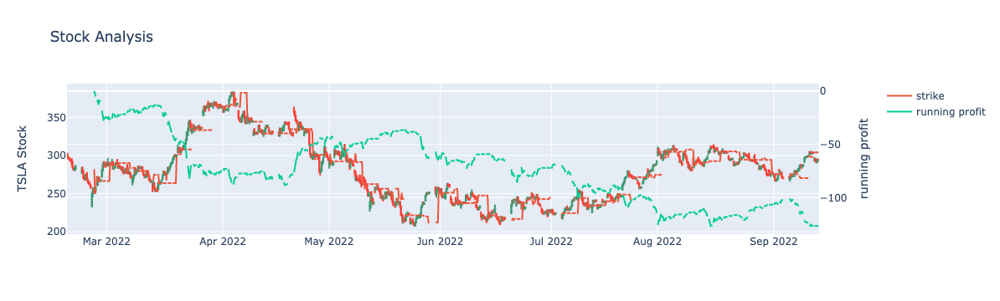

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
299,325.94,328.56,325.08,325.73,9930154.0,334.496306,334.496306,2.04,1.94,0.10,2022-04-20 16:00:00,16,2022-04-22 16:00:00,2.00,-77.32
300,358.53,364.07,353.83,357.57,23957396.0,334.482465,334.482465,24.14,23.18,0.96,2022-04-21 10:00:00,16,2022-04-22 16:00:00,1.25,-76.37
301,357.52,358.91,350.26,352.26,18625751.0,334.474028,334.474028,23.14,18.01,5.13,2022-04-21 11:00:00,16,2022-04-22 16:00:00,1.21,-71.24
302,352.27,352.51,345.36,345.69,12602620.0,334.474028,334.474028,18.02,11.94,6.08,2022-04-21 12:00:00,16,2022-04-22 16:00:00,1.17,-65.16
303,345.75,347.44,343.33,344.55,8857858.0,328.859546,328.859546,17.12,15.95,1.16,2022-04-21 13:00:00,16,2022-04-22 16:00:00,1.12,-64.00
304,344.55,347.17,342.31,342.72,7482388.0,334.474028,334.474028,10.92,9.35,1.56,2022-04-21 14:00:00,16,2022-04-22 16:00:00,1.08,-62.43
305,342.69,342.71,332.67,334.62,12156982.0,334.474028,334.474028,9.34,3.86,5.47,2022-04-21 15:00:00,16,2022-04-22 16:00:00,1.04,-56.96
306,334.69,337.67,332.14,336.26,14782597.0,334.537829,334.537829,3.87,4.65,-0.78,2022-04-21 16:00:00,16,2022-04-22 16:00:00,1.00,-57.74
307,338.41,340.78,331.35,340.00,11712409.0,334.537829,334.537829,4.52,5.75,-1.23,2022-04-22 10:00:00,16,2022-04-22 16:00:00,0.25,-58.97
308,340.04,344.94,335.89,341.57,14888776.0,334.537829,334.537829,5.78,7.12,-1.34,2022-04-22 11:00:00,16,2022-04-22 16:00:00,0.21,-60.32


In [66]:
s = short_calls_dynamic_POC(recent, percent_offset=0, window=30)
plot_candles_and_profit(s)
s.iloc[300-1:350].round(2)

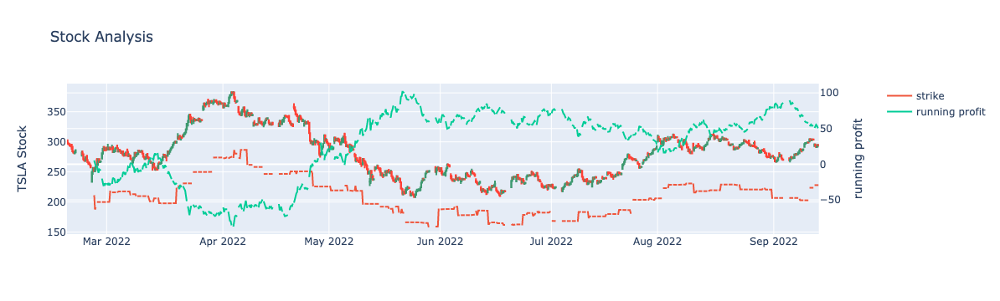

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
299,325.94,328.56,325.08,325.73,9930154.0,334.496306,250.872229,75.11,74.90,0.21,2022-04-20 16:00:00,16,2022-04-22 16:00:00,2.00,-54.91
300,358.53,364.07,353.83,357.57,23957396.0,334.482465,250.861849,107.70,106.73,0.96,2022-04-21 10:00:00,16,2022-04-22 16:00:00,1.25,-53.95
301,357.52,358.91,350.26,352.26,18625751.0,334.474028,250.855521,106.69,101.43,5.26,2022-04-21 11:00:00,16,2022-04-22 16:00:00,1.21,-48.69
302,352.27,352.51,345.36,345.69,12602620.0,334.474028,250.855521,101.44,94.86,6.58,2022-04-21 12:00:00,16,2022-04-22 16:00:00,1.17,-42.11
303,345.75,347.44,343.33,344.55,8857858.0,328.859546,246.64466,99.13,97.92,1.20,2022-04-21 13:00:00,16,2022-04-22 16:00:00,1.12,-40.90
304,344.55,347.17,342.31,342.72,7482388.0,334.474028,250.855521,93.71,91.88,1.83,2022-04-21 14:00:00,16,2022-04-22 16:00:00,1.08,-39.07
305,342.69,342.71,332.67,334.62,12156982.0,334.474028,250.855521,91.86,83.78,8.08,2022-04-21 15:00:00,16,2022-04-22 16:00:00,1.04,-31.00
306,334.69,337.67,332.14,336.26,14782597.0,334.537829,250.903372,83.81,85.38,-1.57,2022-04-21 16:00:00,16,2022-04-22 16:00:00,1.00,-32.56
307,338.41,340.78,331.35,340.00,11712409.0,334.537829,250.903372,87.51,89.10,-1.59,2022-04-22 10:00:00,16,2022-04-22 16:00:00,0.25,-34.15
308,340.04,344.94,335.89,341.57,14888776.0,334.537829,250.903372,89.14,90.67,-1.53,2022-04-22 11:00:00,16,2022-04-22 16:00:00,0.21,-35.68


In [67]:
s = short_calls_dynamic_POC(recent, percent_offset=-25, window=30)
plot_candles_and_profit(s)
s.iloc[300-1:310].round(2)

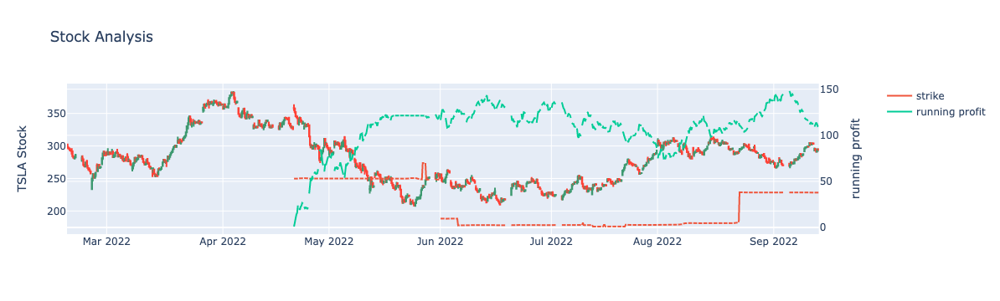

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
299,325.94,328.56,325.08,325.73,9930154.0,NaN,NaN,NaN,NaN,NaN,2022-04-20 16:00:00,16,2022-04-22 16:00:00,2.00,NaN
300,358.53,364.07,353.83,357.57,23957396.0,333.014943,249.761207,108.80,107.83,0.96,2022-04-21 10:00:00,16,2022-04-22 16:00:00,1.25,0.96
301,357.52,358.91,350.26,352.26,18625751.0,333.014943,249.761207,107.78,102.53,5.26,2022-04-21 11:00:00,16,2022-04-22 16:00:00,1.21,6.22
302,352.27,352.51,345.36,345.69,12602620.0,333.014943,249.761207,102.53,95.95,6.58,2022-04-21 12:00:00,16,2022-04-22 16:00:00,1.17,12.80
303,345.75,347.44,343.33,344.55,8857858.0,333.014943,249.761207,96.01,94.81,1.20,2022-04-21 13:00:00,16,2022-04-22 16:00:00,1.12,14.01
304,344.55,347.17,342.31,342.72,7482388.0,333.014943,249.761207,94.81,92.98,1.83,2022-04-21 14:00:00,16,2022-04-22 16:00:00,1.08,15.84
305,342.69,342.71,332.67,334.62,12156982.0,333.014943,249.761207,92.95,84.88,8.08,2022-04-21 15:00:00,16,2022-04-22 16:00:00,1.04,23.92
306,334.69,337.67,332.14,336.26,14782597.0,333.280848,249.960636,84.75,86.32,-1.57,2022-04-21 16:00:00,16,2022-04-22 16:00:00,1.00,22.35
307,338.41,340.78,331.35,340.00,11712409.0,333.546754,250.160065,88.25,89.85,-1.59,2022-04-22 10:00:00,16,2022-04-22 16:00:00,0.25,20.76
308,340.04,344.94,335.89,341.57,14888776.0,333.546754,250.160065,89.88,91.41,-1.53,2022-04-22 11:00:00,16,2022-04-22 16:00:00,0.21,19.23


In [68]:
s = short_calls_dynamic_POC(recent, percent_offset=-25, window=300)
plot_candles_and_profit(s)
s.iloc[300-1:310].round(2)

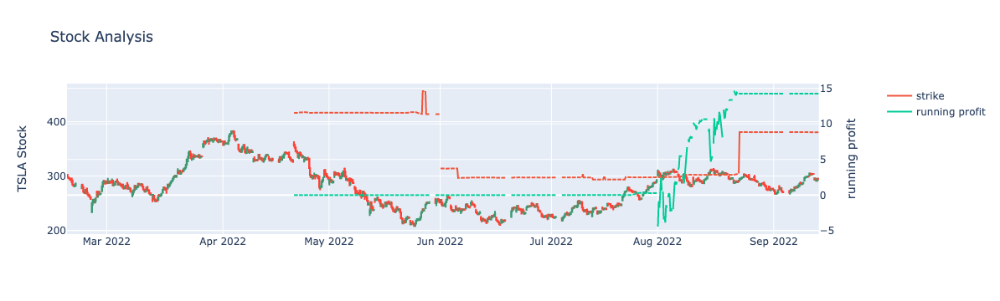

,underlying open,underlying high,underlying low,underlying close,volume,poc,strike,call open,call close,hourly profit,date,week,date_expiration,dte,running profit
299,325.94,328.56,325.08,325.73,9930154.0,NaN,NaN,NaN,NaN,NaN,2022-04-20 16:00:00,16,2022-04-22 16:00:00,2.00,NaN
300,358.53,364.07,353.83,357.57,23957396.0,333.014943,416.268679,0.0,0.0,0.0,2022-04-21 10:00:00,16,2022-04-22 16:00:00,1.25,0.0
301,357.52,358.91,350.26,352.26,18625751.0,333.014943,416.268679,0.0,0.0,0.0,2022-04-21 11:00:00,16,2022-04-22 16:00:00,1.21,0.0
302,352.27,352.51,345.36,345.69,12602620.0,333.014943,416.268679,0.0,0.0,0.0,2022-04-21 12:00:00,16,2022-04-22 16:00:00,1.17,0.0
303,345.75,347.44,343.33,344.55,8857858.0,333.014943,416.268679,0.0,0.0,0.0,2022-04-21 13:00:00,16,2022-04-22 16:00:00,1.12,0.0
304,344.55,347.17,342.31,342.72,7482388.0,333.014943,416.268679,0.0,0.0,0.0,2022-04-21 14:00:00,16,2022-04-22 16:00:00,1.08,0.0
305,342.69,342.71,332.67,334.62,12156982.0,333.014943,416.268679,0.0,0.0,0.0,2022-04-21 15:00:00,16,2022-04-22 16:00:00,1.04,0.0
306,334.69,337.67,332.14,336.26,14782597.0,333.280848,416.601061,0.0,0.0,-0.0,2022-04-21 16:00:00,16,2022-04-22 16:00:00,1.00,0.0
307,338.41,340.78,331.35,340.00,11712409.0,333.546754,416.933442,0.0,0.0,0.0,2022-04-22 10:00:00,16,2022-04-22 16:00:00,0.25,0.0
308,340.04,344.94,335.89,341.57,14888776.0,333.546754,416.933442,0.0,0.0,0.0,2022-04-22 11:00:00,16,2022-04-22 16:00:00,0.21,0.0


In [69]:
s = short_calls_dynamic_POC(recent, percent_offset=25, window=300)
plot_candles_and_profit(s)
s.iloc[300-1:310].round(2)

In [70]:
wsc.head()

,underlying open,underlying high,underlying low,underlying close,volume,strike,call open,call close,weekly profit,date,running profit
0,302.459970,302.459970,281.229972,285.659971,112299184.0,317.582968,2.392834,0.000000,2.392834,2022-02-19 09:30:00,2.392834
1,277.856639,281.499972,233.463310,269.956640,365703165.0,291.749471,2.198191,0.000000,2.198191,2022-02-26 09:30:00,4.591025
2,271.906639,292.773304,271.906639,279.429972,361427246.0,285.501971,2.151119,0.000000,2.151119,2022-03-05 09:30:00,6.742144
3,285.873305,285.873305,265.209973,265.116640,321703470.0,300.166970,2.261613,0.000000,2.261613,2022-03-12 09:30:00,9.003756
4,260.303307,300.656637,253.783308,301.796636,370315043.0,273.318473,2.059322,28.478164,-26.418842,2022-03-19 09:30:00,-17.415085


In [71]:
from monte_carlo import iterate_strategy

offsets= np.arange(-50,55,5)
result_list = iterate_strategy(weekly_short_calls, r, offsets)

In [72]:
result_list[0]

,underlying open,underlying high,underlying low,underlying close,volume,strike,call open,call close,weekly profit,date,running profit
0,302.459970,302.459970,281.229972,285.659971,112299184.0,151.229985,151.292121,134.429987,16.862135,2022-02-19 09:30:00,16.862135
1,277.856639,281.499972,233.463310,269.956640,365703165.0,138.928319,138.985402,131.028320,7.957081,2022-02-26 09:30:00,24.819216
2,271.906639,292.773304,271.906639,279.429972,361427246.0,135.953320,136.009179,143.476652,-7.467473,2022-03-05 09:30:00,17.351743
3,285.873305,285.873305,265.209973,265.116640,321703470.0,142.936652,142.995381,122.179988,20.815394,2022-03-12 09:30:00,38.167137
4,260.303307,300.656637,253.783308,301.796636,370315043.0,130.151654,130.205130,171.644983,-41.439853,2022-03-19 09:30:00,-3.272716
5,305.016636,345.269965,304.373303,336.879966,421044307.0,152.508318,152.570980,184.371648,-31.800668,2022-03-26 09:30:00,-35.073385
6,354.999964,368.899963,354.999964,361.529964,315782236.0,177.499982,177.572912,184.029982,-6.457069,2022-04-02 09:30:00,-41.530454
7,363.166630,382.403295,342.253299,341.829966,369044633.0,181.583315,181.657923,160.246651,21.411272,2022-04-09 09:30:00,-20.119181
8,326.713301,339.409966,326.713301,328.333301,221665522.0,163.356650,163.423769,164.976650,-1.552881,2022-04-16 09:30:00,-21.672062
9,329.729967,358.533297,325.906634,335.016633,320584643.0,164.864984,164.932722,170.151650,-5.218927,2022-04-23 09:30:00,-26.890989


In [73]:
from plotly.colors import n_colors
n_colors('rgb(0, 0, 0)', 'rgb(255, 255, 255)', 15, colortype='rgb')

['rgb(0.0, 0.0, 0.0)',
 'rgb(18.214285714285715, 18.214285714285715, 18.214285714285715)',
 'rgb(36.42857142857143, 36.42857142857143, 36.42857142857143)',
 'rgb(54.642857142857146, 54.642857142857146, 54.642857142857146)',
 'rgb(72.85714285714286, 72.85714285714286, 72.85714285714286)',
 'rgb(91.07142857142858, 91.07142857142858, 91.07142857142858)',
 'rgb(109.28571428571429, 109.28571428571429, 109.28571428571429)',
 'rgb(127.5, 127.5, 127.5)',
 'rgb(145.71428571428572, 145.71428571428572, 145.71428571428572)',
 'rgb(163.92857142857144, 163.92857142857144, 163.92857142857144)',
 'rgb(182.14285714285717, 182.14285714285717, 182.14285714285717)',
 'rgb(200.35714285714286, 200.35714285714286, 200.35714285714286)',
 'rgb(218.57142857142858, 218.57142857142858, 218.57142857142858)',
 'rgb(236.7857142857143, 236.7857142857143, 236.7857142857143)',
 'rgb(255.0, 255.0, 255.0)']

In [74]:
import plotly.express as px

n_colors = 25
colors = px.colors.sample_colorscale("viridis", [n/(n_colors -1) for n in range(n_colors)])
colors

['rgb(68, 1, 84)',
 'rgb(70, 16, 98)',
 'rgb(71, 30, 111)',
 'rgb(71, 44, 122)',
 'rgb(67, 56, 128)',
 'rgb(63, 69, 135)',
 'rgb(59, 81, 138)',
 'rgb(54, 92, 140)',
 'rgb(49, 104, 142)',
 'rgb(45, 114, 142)',
 'rgb(41, 124, 142)',
 'rgb(37, 133, 141)',
 'rgb(34, 144, 140)',
 'rgb(32, 154, 138)',
 'rgb(37, 164, 133)',
 'rgb(45, 174, 127)',
 'rgb(53, 183, 121)',
 'rgb(74, 192, 109)',
 'rgb(96, 200, 96)',
 'rgb(119, 208, 82)',
 'rgb(146, 214, 65)',
 'rgb(172, 220, 49)',
 'rgb(199, 224, 42)',
 'rgb(226, 228, 39)',
 'rgb(253, 231, 37)']

In [76]:
from plots import plots

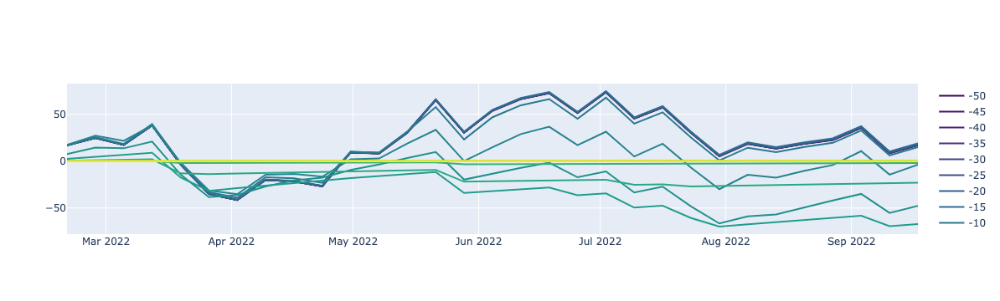

In [77]:
plots(result_list, offsets, {'show_afterhours':True})

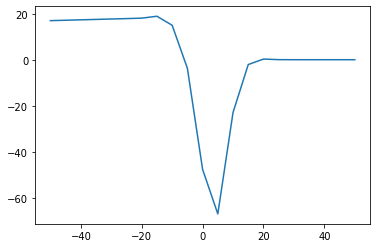

In [78]:
import plots
plots.compare_final_profits(result_list, offsets)

In [80]:
from monte_carlo import iterate_strategy
offset_results = iterate_strategy(weekly_short_calls, tsla, offsets = np.arange(-50,55,5))

In [81]:
from plots import plots

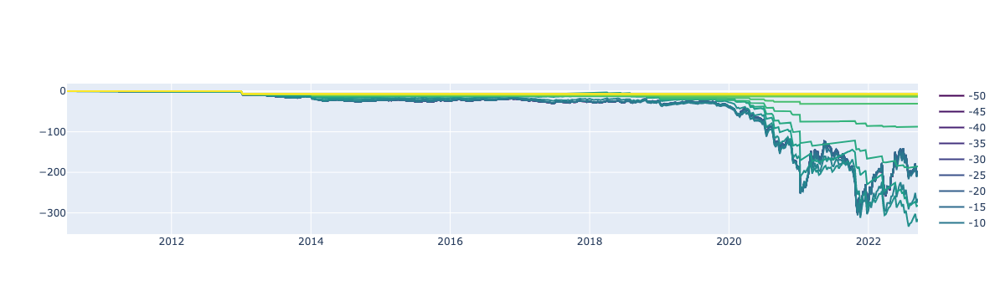

In [83]:
plots(offset_results, offsets = np.arange(-50,55,5))